# MultiVisit Analysis of six eclipses of WASP-189b

We have analysed five visits of WASP-189 individually -- now we will use `pycheops.MultiVisit` to analyse both of the visits simultaneously.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from dace.cheops import Cheops
import pycheops
from uncertainties import ufloat
from uncertainties.umath import sqrt as usqrt
import lmfit as lmf
import re
from pycheops.utils import phaser
from pycheops.constants import c, au

Let's load the saved datasets using `MultiVisit` class.

In [2]:
M = pycheops.MultiVisit('WASP-189', ident='none', verbose=False)

In [3]:
#rprs = np.random.normal(0.060907361661750425, 0.003144594526637345, 10000)
dep, dep_err = 0.00502077*1e6, 1.3388*1e-05*1e6

"""
star = pycheops.StarProperties(dd.target)
print(star)
"""
teff = np.random.normal(8000, 80, 10000)
logg = np.random.normal(3.9, 0.2, 10000)
mh = np.random.normal(0.29, 0.13, 10000)
h1, h2 = np.zeros(10000), np.zeros(10000)
cdc = pycheops.ld.stagger_power2_interpolator('CHEOPS')
for i in range(len(teff)):
    c1, c2, h1[i], h2[i] = cdc(teff[i], logg[i], mh[i])
# However, since Teff is out of the range of stagger, the above code will produce Nan in h1 and h2
# So, we are using values of h1 and h2 from tutorial.
a_c = 0.05172172 * au/c / 86400

In [4]:
# I have tried this with nroll=3, but it is better with nroll=1 (Delta  BIC = ~200)
TJD_0 = M.tzero(2456706.4558, 2.72403380) # First argument is T_0 in previous epoch
result = M.fit_eclipse(unroll=True, nroll=3, unwrap=True, P=2.72403380, D=0.00502077, a_c=a_c, L=1.0046e-04,
                       edv=True, edv_prior=50e-6, 
                       W=ufloat(0.06619157,5.4123e-05), b=ufloat(0.43638546,0.01208119), T_0=ufloat(TJD_0,0.1), 
                       burn=1024, steps=256, nwalkers=256)

Running burn-in ..


100%|██████████| 1024/1024 [30:03<00:00,  1.76s/it]

Running sampler ..



100%|██████████| 256/256 [07:43<00:00,  1.81s/it]


In [5]:
print(M.fit_report(min_correl=0.8))

[[Fit Statistics]]
    # fitting method   = emcee
    # function evals   = 321865
    # data points      = 6421
    # variables        = 30
    chi-square         = 10933.9549
    reduced chi-square = 1.71083632
    Akaike info crit   = -99568.4891
    Bayesian info crit = -99365.4693
    RMS residual       = 107.8 ppm
[[Variables]]
    D:               0.00502077 (fixed)
    W:               0.06619541 +/- 6.7482e-05 (0.10%) (init = 0.06619157)
    b:               0.43400047 +/- 0.01428147 (3.29%) (init = 0.4363855)
    P:               2.724034 (fixed)
    T_0:             1965.31406 +/- 0.01570555 (0.00%) (init = 1964.68)
    f_c:             0 (fixed)
    f_s:             0 (fixed)
    L:               0.00010046 (fixed)
    a_c:             0.0002987197 (fixed)
    k:               0.07085739 == 'sqrt(D)'
    aR:              4.70750676 == 'sqrt((1+k)**2-b**2)/W/pi'
    sini:            0.99574113 == 'sqrt(1 - (b/aR)**2)'
    logrho:         -0.72436543 == 'log10(4.3275e-4*((1+k)

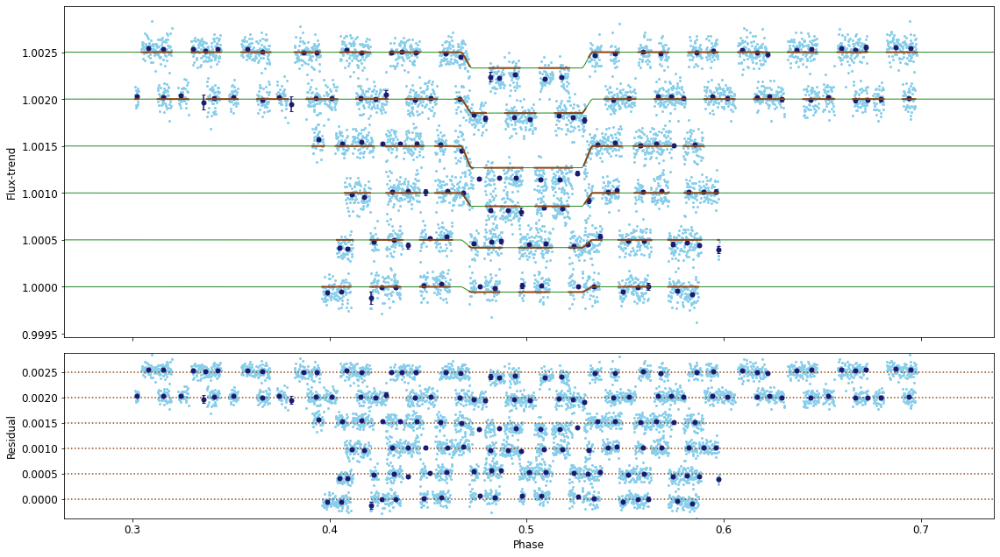

In [6]:
M.plot_fit(binwidth=0.01, data_offset=0.0005, res_offset=0.0005, detrend=True, figsize=(16,9));

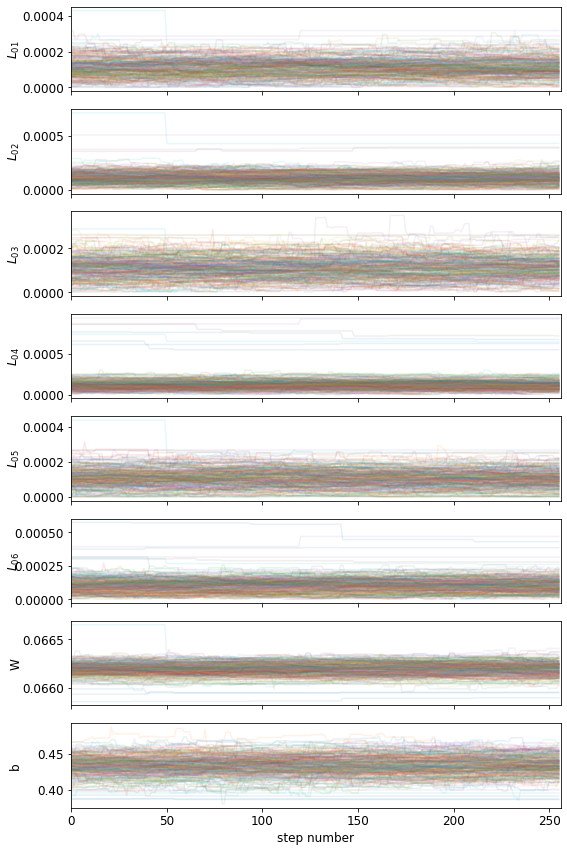

In [7]:
M.trail_plot();

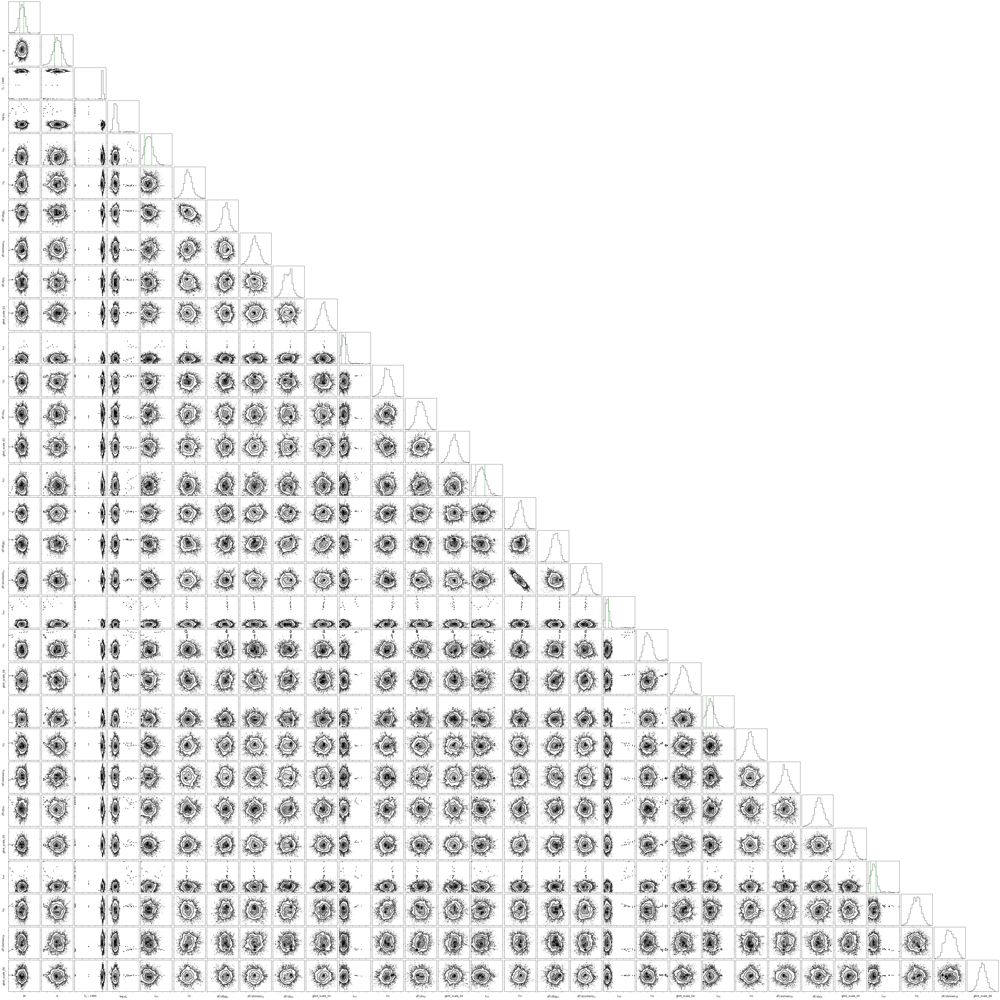

In [8]:
M.corner_plot(plotkeys='all');

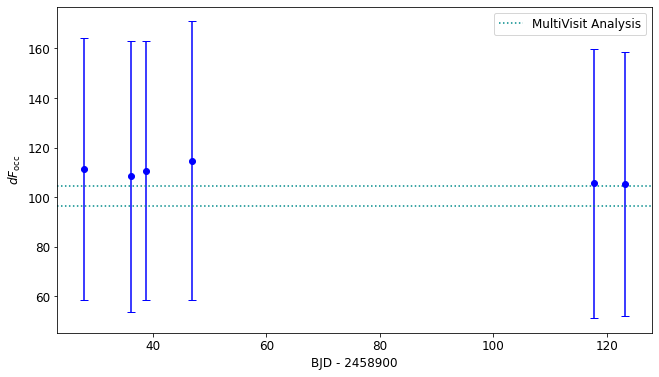

In [11]:
fig,ax = plt.subplots(figsize=(16/1.5,9/1.5))
for j in range(6):
    t = M.datasets[j].lc['time'].mean() - 1900
    l = result.params[f'L_{j+1:02d}'].value*1e6
    lerr = result.params[f'L_{j+1:02d}'].stderr*1e6
    ax.errorbar(t,l,yerr=lerr,fmt='bo',capsize=4)
plt.axhline((1.0046e-04+3.9983e-06)*1e6,c='darkcyan',ls=':',label='MultiVisit Analysis')
plt.axhline((1.0046e-04-3.9983e-06)*1e6,c='darkcyan',ls=':')
ax.set_xlabel('BJD - 2458900')
ax.set_ylabel(r'$dF_{\rm occ}$')
ax.legend();